# Downloading the Data and Extracting it

In [ ]:
!gdown https://drive.google.com/uc?id=1Qc66kVqetwJIK7cKXnXxbPJy6gnpRSRI
!unzip The_Data.zip

In [ ]:
Nfrom.google.colab import drive
drive.mount('/content/drive')

Now define the paths to the train test and pred folders

In [ ]:
trainpath = './seg_train/'
testpath = './seg_test/'
predpath = './seg_pred/'

# Data Loading


Now let's first check the Train folder to have a look to its content

In [ ]:
for folder in  os.listdir(trainpath + 'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2274 in folder sea
For training data , found 2404 in folder glacier
For training data , found 2512 in folder mountain
For training data , found 2271 in folder forest
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings


Ok, how about the test folder

In [ ]:
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 510 in folder sea
For testing data , found 553 in folder glacier
For testing data , found 525 in folder mountain
For testing data , found 474 in folder forest
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings


_____
Now for prediction folder

In [ ]:
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


_____

# Checking Images

Now we need to check the images sizes , to know how they look like

Since we have 6 categories , we first need to create a dictionary with their names & indices. This is known as integer encoding. Also create a function to get the code back

In [ ]:
code_to_num = {'buildings':0 ,'forest':1, 'glacier':2, 'mountain':3, 'sea':4, 'street':5}
num_to_code = {0:'buildings' ,1:'forest', 2:'glacier', 3:'mountain', 4:'sea', 5:'street'}

def get_code(n) : 
    if n in num_to_code:
        return num_to_code[n]    

def get_num(c):
    if c in code_to_num:
        return code_to_num[c] 

Now how about the images sizes in train folder

In [ ]:
size = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(123, 150, 3)        2
(142, 150, 3)        2
(144, 150, 3)        2
(108, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(136, 150, 3)        2
(119, 150, 3)        1
(133, 150, 3)        1
(100, 150, 3)        1
(140, 150, 3)        1
(131, 150, 3)        1
(149, 150, 3)        1
(105, 150, 3)        1
(141, 150, 3)        1
(115, 150, 3)        1
(76, 150, 3)         1
(110, 150, 3)        1
(120, 150, 3)        1
(147, 150, 3)        1
(102, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(81, 150, 3)         1
(124, 150, 3)        1
(97, 150, 3)         1
dtype: int64

______

Ok, almost all of them are (150,150,3), how about test images ? 

In [ ]:
size = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(72, 150, 3)        1
(110, 150, 3)       1
(76, 150, 3)        1
(141, 150, 3)       1
(81, 150, 3)        1
(149, 150, 3)       1
(131, 150, 3)       1
dtype: int64

Almost same ratios  
Now to prediction images 

In [ ]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(100, 150, 3)       1
(124, 150, 3)       1
(133, 150, 3)       1
(139, 150, 3)       1
(112, 150, 3)       1
(129, 150, 3)       1
(374, 500, 3)       1
(144, 150, 3)       1
(108, 150, 3)       1
(126, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(131, 150, 3)       1
dtype: int64

Ok , since almost all of pictures are (150,150,3) , we can use all pictures in our model, after resizing it to a particular size

# Reading Images

Now it's time to read all images & convert it into arrays

First we'll create a variable s , which refer to size , so we can change it easily 

Let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [ ]:
s = 100

Now to read all pictues in six categories in training folder, and use OpenCV to resize it. And not to forget assigning the y value from the predefined function 

In [ ]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') : 
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(get_num(folder))

Great , now how many items in X_train 

In [ ]:
print(f'we have {len(X_train)} items in X_train')

we have 14034 items in X_train


Also we have have a look to random pictures in X_train , and to adjust their title using the y value

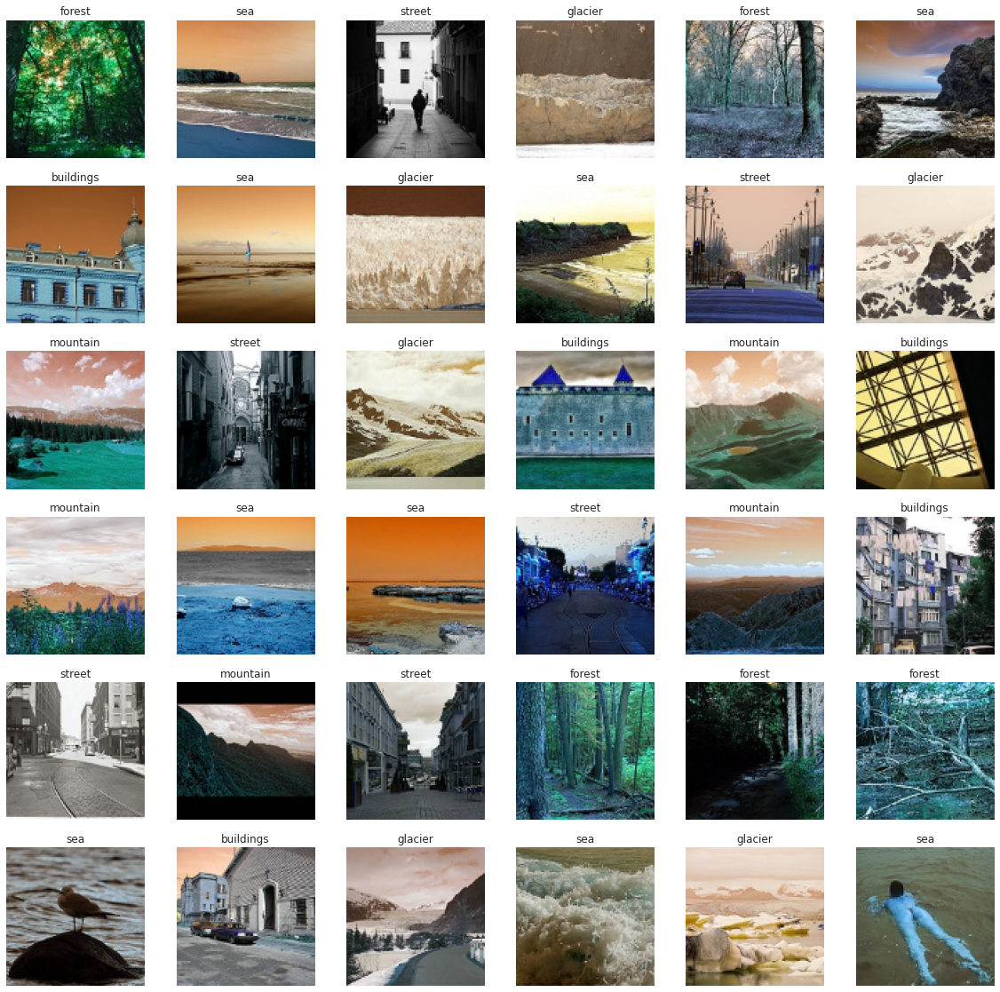

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(get_code(y_train[i]))

Great , now to repeat same steps exactly in test data

In [ ]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') : 
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(get_num(folder))
        

In [ ]:
print(f'we have {len(X_test)} items in X_test')

we have 3000 items in X_test


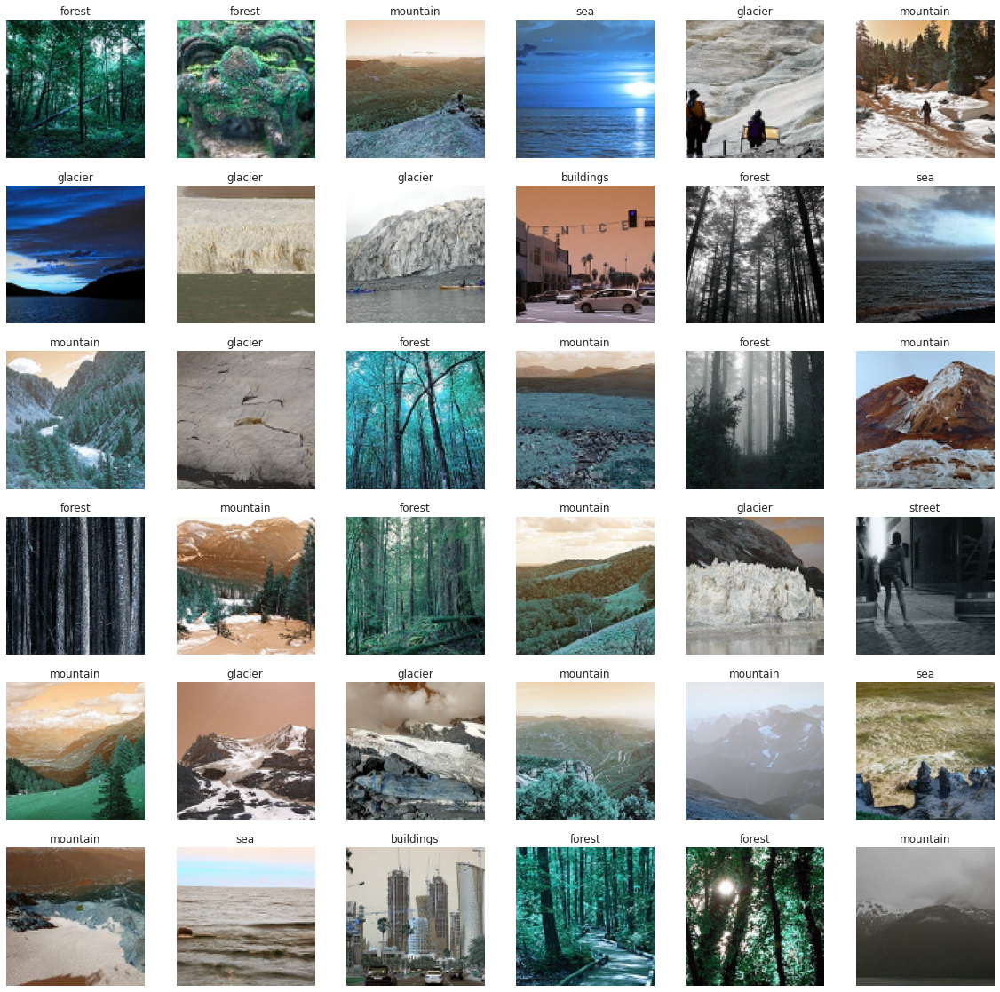

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    plt.title(get_code(y_test[i]))

Also with Prediction data , without having title ofcourse

In [ ]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))       

In [ ]:
print(f'we have {len(X_pred)} items in X_pred')

we have 7301 items in X_pred


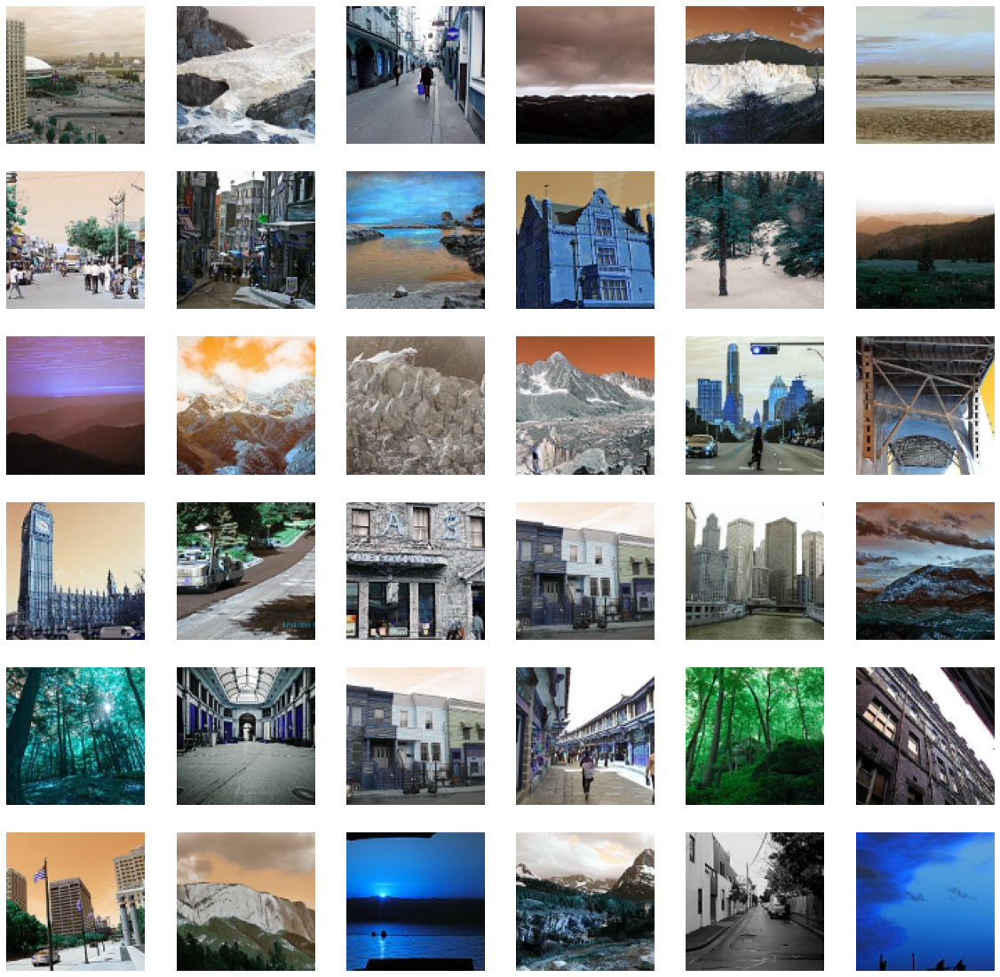

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

________

# Building The Model 

Now we need to build the model to train our data

First we convert the data into arrays using numpy

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


Now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Dropouts and Dense layer

In [ ]:

KerasModel = keras.models.Sequential()
    
KerasModel.add(  keras.layers.Conv2D(64,(4,4),activation="relu",input_shape=(100,100,3)) )
KerasModel.add(  keras.layers.MaxPool2D(pool_size=(3,3)) )
KerasModel.add(  keras.layers.Dropout(0.2) )
KerasModel.add(  keras.layers.Conv2D(128,(4,4),activation="relu") )
KerasModel.add(  keras.layers.MaxPool2D(pool_size=(3,3)) )
KerasModel.add(  keras.layers.Dropout(0.2) )
KerasModel.add(  keras.layers.Conv2D(128,(4,4),activation="relu") )
KerasModel.add(  keras.layers.MaxPool2D(pool_size=(2,2)) )
KerasModel.add(  keras.layers.Dropout(0.2) )
KerasModel.add(  keras.layers.Flatten()  )
KerasModel.add(  keras.layers.Dense(6,activation="sigmoid")  )
    



Now to compile the model , using adam optimizer , & sparse categorical crossentropy loss

In [ ]:
KerasModel.compile(optimizer='adam', loss='sparse_categorical_crossentropy',metrics='accuracy')

So how the model looks like ? 

In [ ]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 97, 97, 64)        3136      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 29, 29, 128)       131200    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 9, 9, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 9, 9, 128)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None,

Now to train the model , lets use 50 epochs now

In [ ]:
ThisModel = KerasModel.fit(X_train,y_train,epochs=50)

Epoch 1/50
439/439 [==============================] - 51s 18ms/step - loss: 10.1284 - accuracy: 0.3855
Epoch 2/50
439/439 [==============================] - 8s 17ms/step - loss: 1.0650 - accuracy: 0.5804
Epoch 3/50
439/439 [==============================] - 8s 17ms/step - loss: 0.9797 - accuracy: 0.6192
Epoch 4/50
439/439 [==============================] - 8s 17ms/step - loss: 0.9405 - accuracy: 0.6333
Epoch 5/50
439/439 [==============================] - 8s 17ms/step - loss: 0.8766 - accuracy: 0.6695
Epoch 6/50
439/439 [==============================] - 8s 17ms/step - loss: 0.8365 - accuracy: 0.6892
Epoch 7/50
439/439 [==============================] - 8s 17ms/step - loss: 0.7846 - accuracy: 0.7156
Epoch 8/50
439/439 [==============================] - 8s 17ms/step - loss: 0.7592 - accuracy: 0.7171
Epoch 9/50
439/439 [==============================] - 8s 17ms/step - loss: 0.7353 - accuracy: 0.7267
Epoch 10/50
439/439 [==============================] - 8s 17ms/step - loss: 0.7327 - accu

How is the final loss & accuracy?


In [ ]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 1s 6ms/step - loss: 0.7354 - accuracy: 0.7670
Test Loss is 0.7354208827018738
Test Accuracy is 0.7670000195503235



_______

Now to predict X_test

In [ ]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

Prediction Shape is (3000, 6)



Now it's time to predict X_Predict

In [ ]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

Prediction Shape is (7301, 6)


And show random redicted pictures & its predicting category


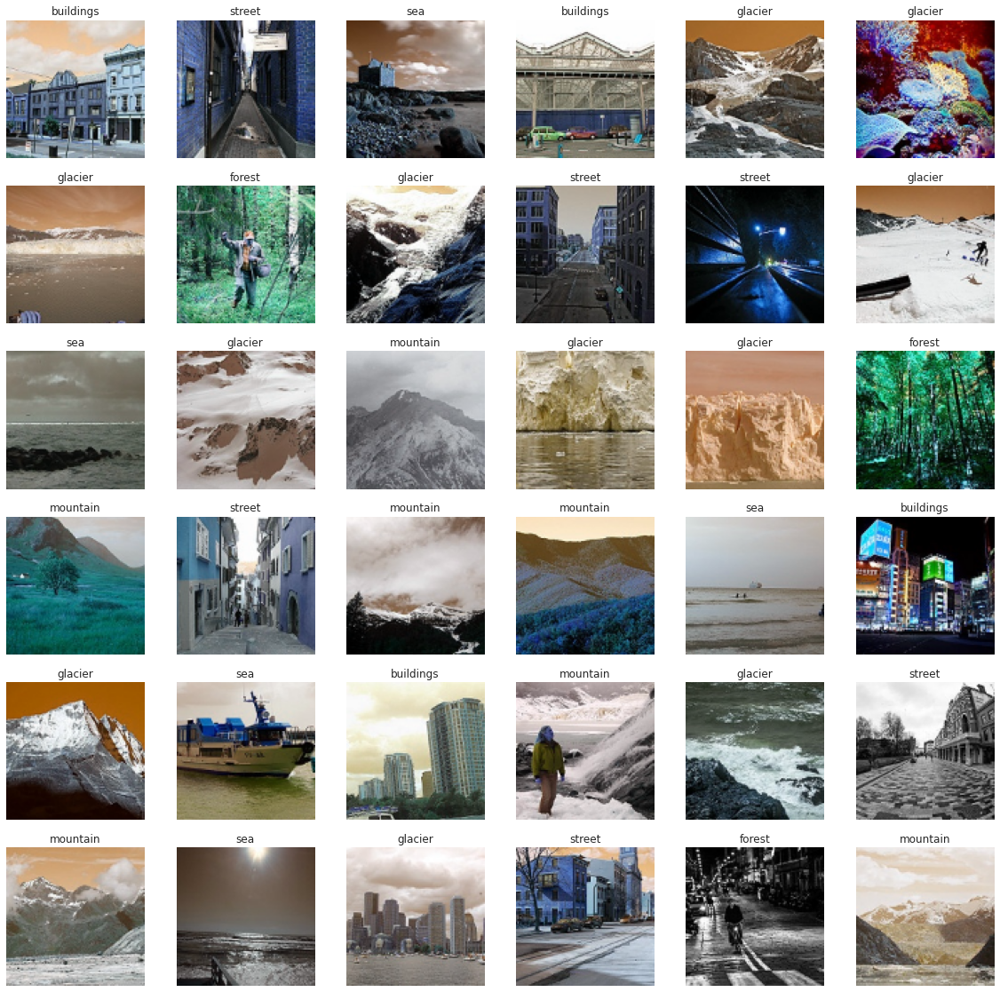

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(get_code(np.argmax(y_result[i])))

## **Transfer Learning using VGG16**

In [ ]:
vgg16 = keras.applications.VGG16(weights='imagenet',include_top=False,input_shape=(100,100,3))
for layers in vgg16.layers :
  layers.trainable=False

flattened=keras.layers.Flatten()(vgg16.output)
output_layer=keras.layers.Dense(6,activation='sigmoid')(flattened)

vgg_model=keras.models.Model(inputs=vgg16.input,outputs=output_layer)
vgg_model.summary()

58892288/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100, 100, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 100, 100, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 100, 100, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 50, 50, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 50, 50, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 50, 50, 128)       147584    
______________________________________________________________

In [ ]:
vgg_model.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
Training_vgg = vgg_model.fit(X_train,y_train,epochs=10)

Epoch 1/10
439/439 [==============================] - 39s 18ms/step - loss: 3.1675 - accuracy: 0.7894
Epoch 2/10
439/439 [==============================] - 8s 17ms/step - loss: 1.0958 - accuracy: 0.9049
Epoch 3/10
439/439 [==============================] - 8s 17ms/step - loss: 0.7827 - accuracy: 0.9180
Epoch 4/10
439/439 [==============================] - 7s 17ms/step - loss: 0.5946 - accuracy: 0.9348
Epoch 5/10
439/439 [==============================] - 7s 17ms/step - loss: 0.4880 - accuracy: 0.9453
Epoch 6/10
439/439 [==============================] - 7s 17ms/step - loss: 0.5151 - accuracy: 0.9443
Epoch 7/10
439/439 [==============================] - 8s 17ms/step - loss: 0.3918 - accuracy: 0.9561
Epoch 8/10
439/439 [==============================] - 8s 17ms/step - loss: 0.3167 - accuracy: 0.9624
Epoch 9/10
439/439 [==============================] - 8s 17ms/step - loss: 0.3572 - accuracy: 0.9600
Epoch 10/10
439/439 [==============================] - 8s 17ms/step - loss: 0.3584 - accur

In [ ]:
ModelLoss, ModelAccuracy = vgg_model.evaluate(X_test, y_test)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 2s 22ms/step - loss: 3.6903 - accuracy: 0.8757
Test Loss is 3.6902942657470703
Test Accuracy is 0.8756666779518127


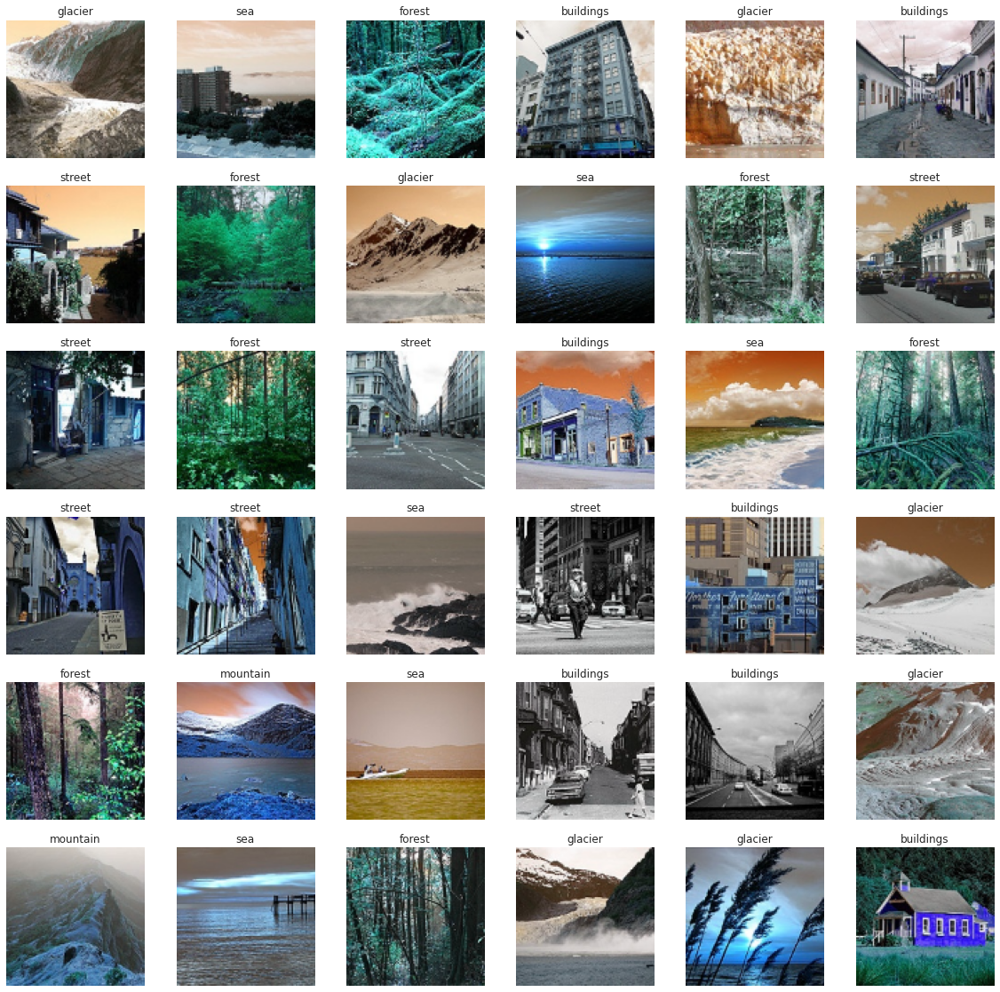

In [ ]:
vgg_pred=vgg_model.predict(X_pred_array)
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(vgg_pred),36))):
  plt.subplot(6,6,n+1)
  plt.imshow(X_pred_array[i])
  plt.axis("off")
  plt.title(get_code(np.argmax(vgg_pred[i])))